<a href="https://colab.research.google.com/github/denizgulal/easy_deep_dream/blob/main/easy_deep_dream.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np

In [2]:
base_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')

87910968/87910968 [==============================] - 5s 0us/step


In [3]:
base_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv2d (Conv2D)                (None, None, None,   864         ['input_1[0][0]']                
                                32)                                                               
                                                                                                  
 batch_normalization (BatchNorm  (None, None, None,   96         ['conv2d[0][0]']                 
 alization)                     32)                                                    

In [4]:
names = ['mixed3', 'mixed5'] #pick the layers to play with

In [5]:
layers = [base_model.get_layer(name).output for name in names]

In [6]:
deep_dream_model = tf.keras.Model(inputs = base_model.input, outputs = layers)

In [7]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [8]:
image = tf.keras.preprocessing.image.load_img('/content/drive/MyDrive/Computer Vision Masterclass/Images/StaryNight.jpg',
                                              target_size=(225, 375))

(-0.5, 374.5, 224.5, -0.5)

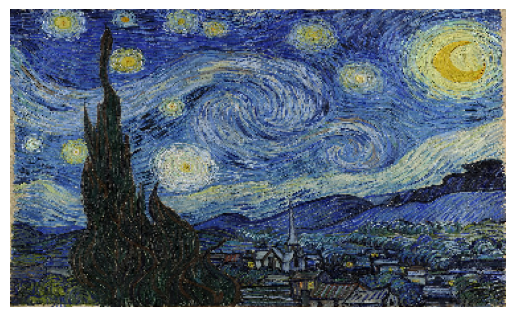

In [9]:
plt.imshow(image);
plt.axis('off')

In [10]:
image = tf.keras.preprocessing.image.img_to_array(image)
image = tf.keras.applications.inception_v3.preprocess_input(image)

In [11]:
image_batch = tf.expand_dims(image, axis = 0)
activations = deep_dream_model.predict(image_batch)

1/1 [==============================] - 9s 9s/step


In [12]:
def calculate_loss(image, network):
  image_batch = tf.expand_dims(image, axis = 0)
  activations = network(image_batch)

  losses = []
  for act in activations:
    loss = tf.math.reduce_mean(act)
    losses.append(loss)
  return tf.reduce_sum(losses)

In [13]:
@tf.function
def deep_dream(network, image, learning_rate):
  with tf.GradientTape() as tape:
    tape.watch(image)
    loss = calculate_loss(image, network)

  gradients = tape.gradient(loss, image)
  gradients /= tf.math.reduce_std(gradients)
  image = image + gradients * learning_rate
  image = tf.clip_by_value(image, -1, 1)

  return loss, image

In [14]:
def inverse_transform(image):
  image = 255 * (image + 1.0) / 2.0
  return tf.cast(image, tf.uint8)

In [15]:
def run_deep_dream(network, image, epochs, learning_rate):
  for epoch in range(epochs):
    loss, image = deep_dream(network, image, learning_rate)

    if epoch % 250 == 0:
      plt.figure(figsize=(6,6))
      plt.imshow(inverse_transform(image))
      plt.axis('off')
      plt.show()
      print('Epoch {}, loss {}'.format(epoch, loss))

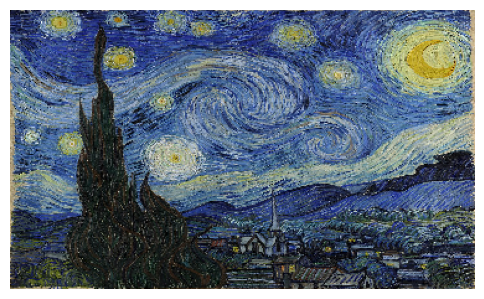

Epoch 0, loss 0.6180765628814697


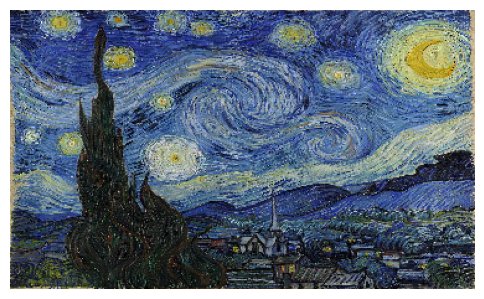

Epoch 250, loss 0.9184178113937378


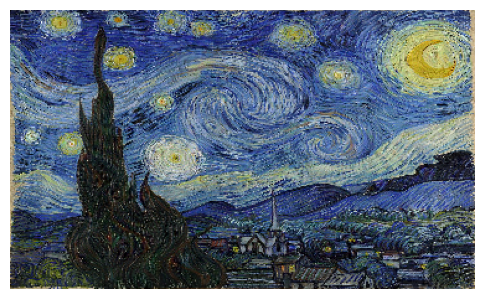

Epoch 500, loss 1.1451070308685303


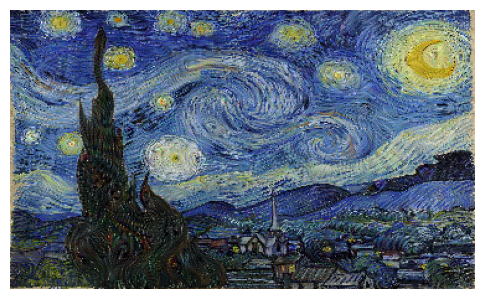

Epoch 750, loss 1.3160067796707153


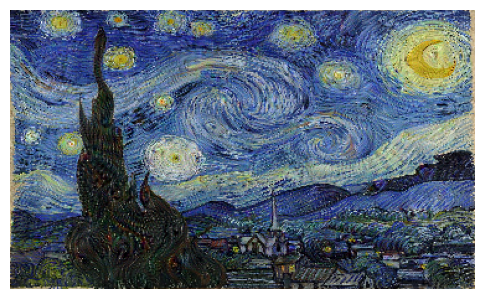

Epoch 1000, loss 1.4470312595367432


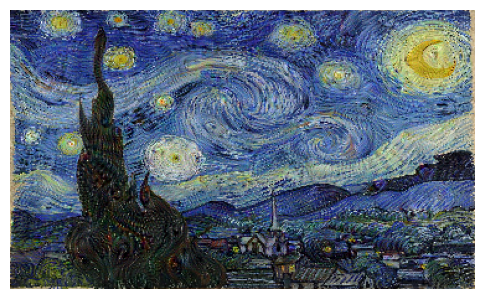

Epoch 1250, loss 1.5511043071746826


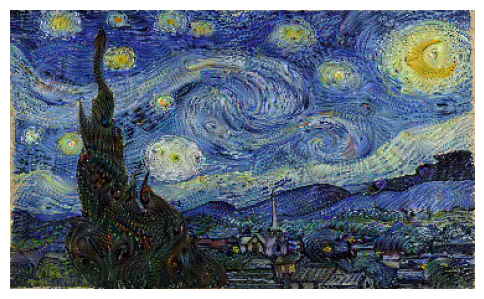

Epoch 1500, loss 1.636704444885254


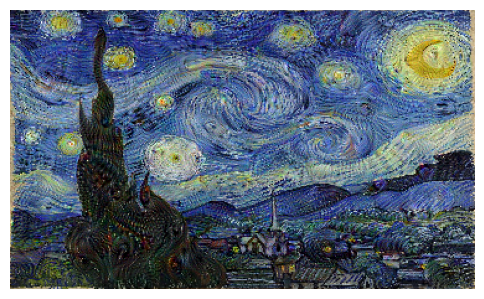

Epoch 1750, loss 1.7100646495819092


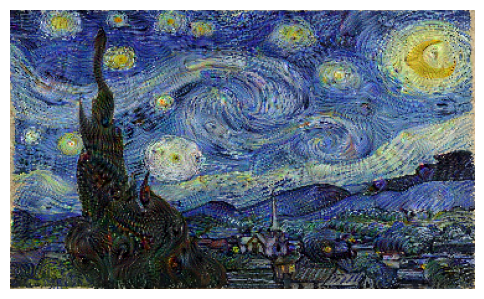

Epoch 2000, loss 1.7738059759140015


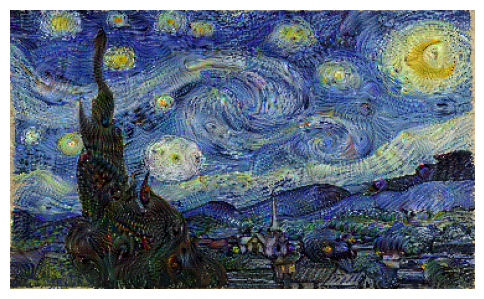

Epoch 2250, loss 1.8297933340072632


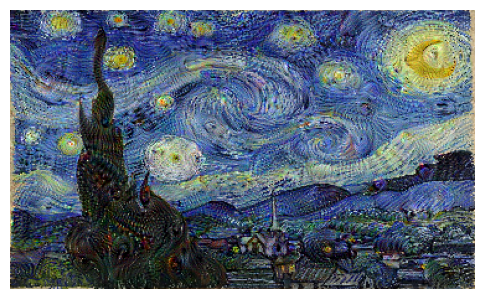

Epoch 2500, loss 1.8802664279937744


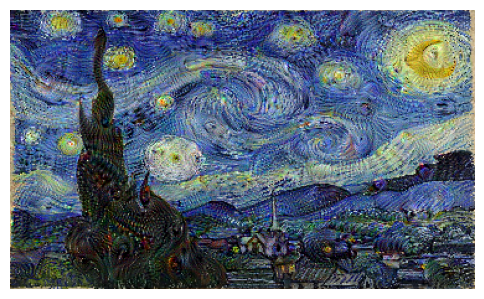

Epoch 2750, loss 1.925763726234436


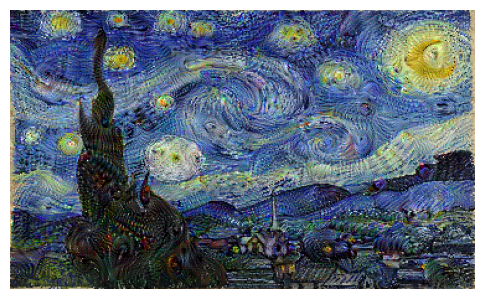

Epoch 3000, loss 1.966862678527832


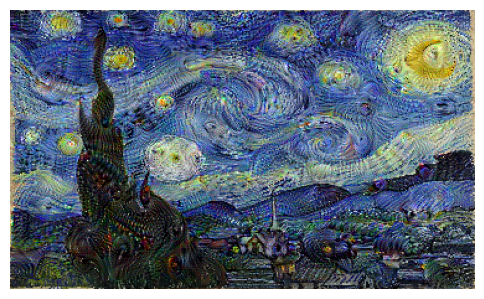

Epoch 3250, loss 2.0049190521240234


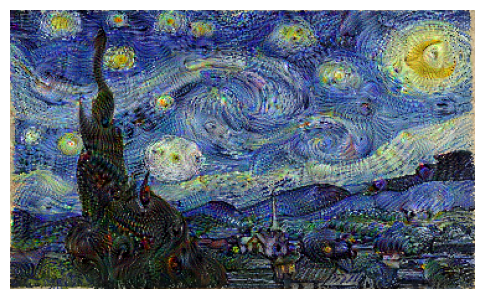

Epoch 3500, loss 2.0408172607421875


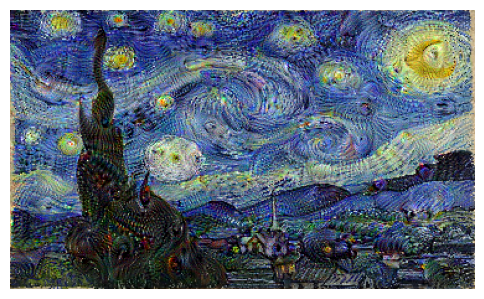

Epoch 3750, loss 2.0748682022094727


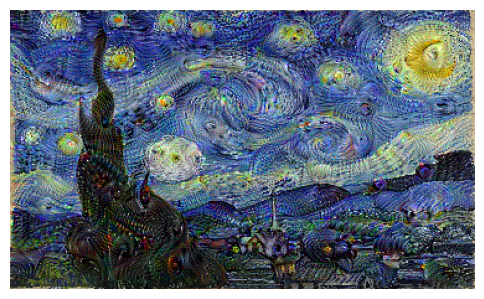

Epoch 4000, loss 2.106890916824341


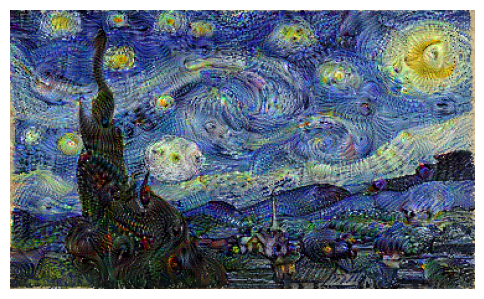

Epoch 4250, loss 2.13724946975708


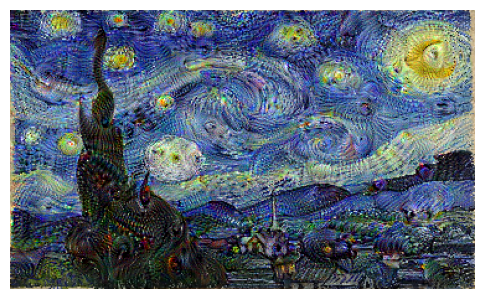

Epoch 4500, loss 2.1659812927246094


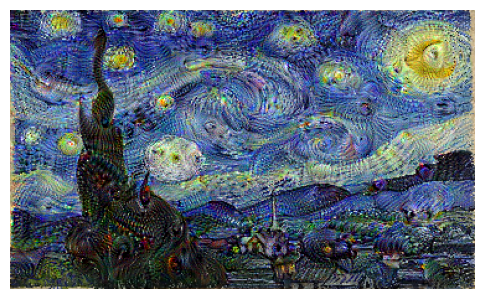

Epoch 4750, loss 2.193436861038208


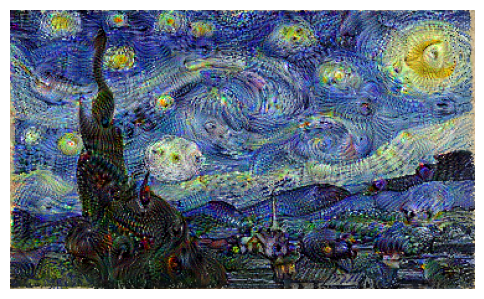

Epoch 5000, loss 2.2192509174346924


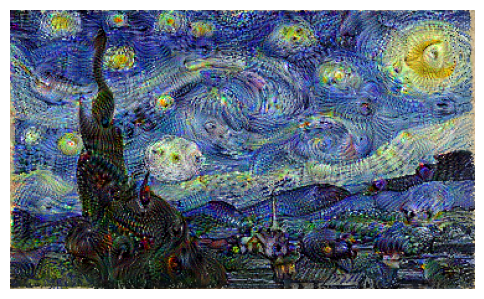

Epoch 5250, loss 2.2438199520111084


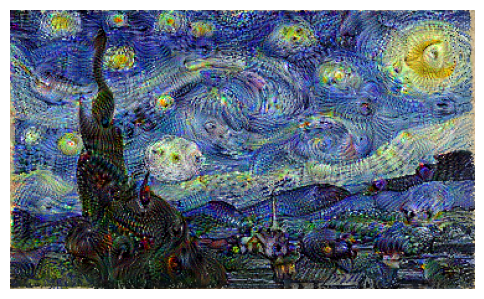

Epoch 5500, loss 2.2674801349639893


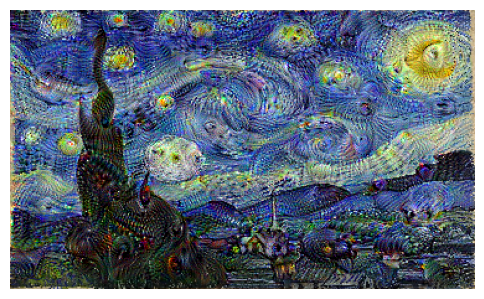

Epoch 5750, loss 2.2901434898376465


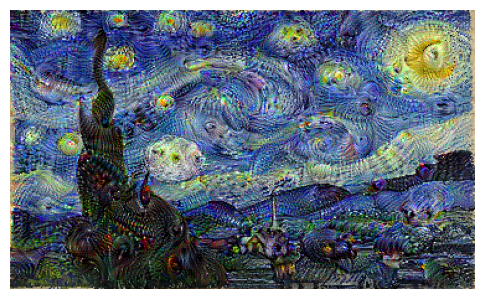

Epoch 6000, loss 2.3116841316223145


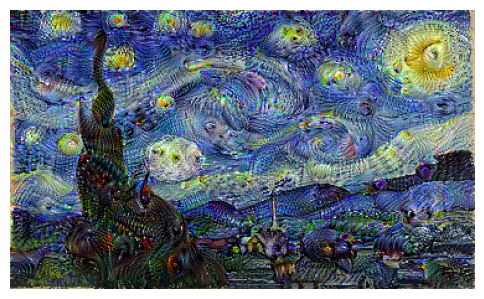

Epoch 6250, loss 2.3326430320739746


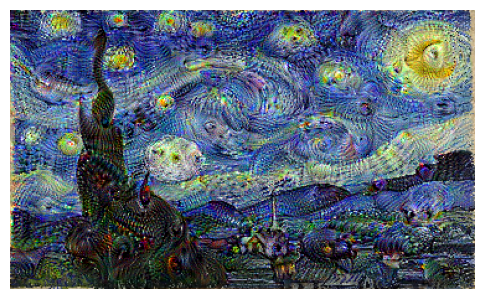

Epoch 6500, loss 2.3526611328125


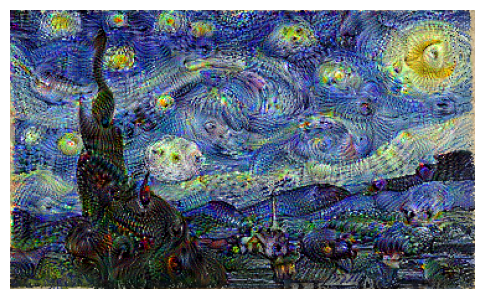

Epoch 6750, loss 2.3719725608825684


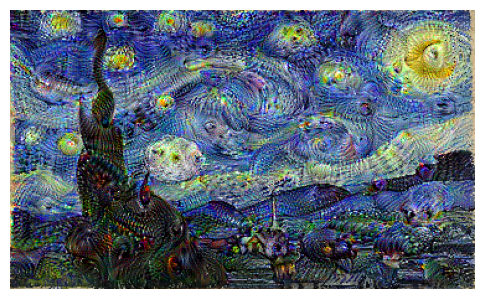

Epoch 7000, loss 2.391000747680664


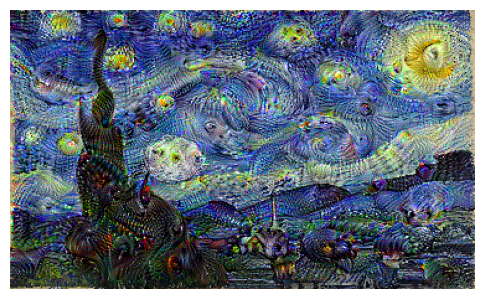

Epoch 7250, loss 2.409640073776245


In [16]:
run_deep_dream(network=deep_dream_model, image=image, epochs = 7500, learning_rate=0.0001)